# Preferential Bayesian Optimization: RANDOM
This notebook demonstrates the use of random querying on ordinal (preference) data.

Formulation by Nguyen Quoc Phong.

In [1]:
import numpy as np
import gpflow
import tensorflow as tf
import tensorflow_probability as tfp
import matplotlib.pyplot as plt
import sys
import os
import pickle

from gpflow.utilities import set_trainable, print_summary
gpflow.config.set_default_summary_fmt("notebook")

sys.path.append(os.path.split(os.path.split(os.path.split(os.getcwd())[0])[0])[0]) # Move 3 levels up directory to import PBO
import PBO

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  5


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
        for gpu in gpus:
              tf.config.experimental.set_memory_growth(gpu, True)
        tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

5 Physical GPUs, 1 Logical GPU


In [4]:
lengthscale = 1.
lengthscale_prior_alpha = tf.constant(3, dtype=tf.float64)
lengthscale_prior_beta = tf.constant(3, dtype=tf.float64)

In [5]:
objective = PBO.objectives.six_hump_camel
objective_low = -1.5
objective_high = 1.5
objective_name = "SHC"
acquisition_name = "RANDOM_TEST2"
experiment_name = "PBO" + "_" + acquisition_name + "_" + objective_name

In [6]:
num_runs = 20
num_evals = 20
num_samples = 1000
num_choices = 2
input_dims = 2
num_maximizers = 20
num_init_points = 3
num_inducing_init = 3
num_discrete_per_dim = 1000 # Discretization of continuous input space

In [7]:
results_dir = os.getcwd() + '/results/' + experiment_name + '/'

try:
    # Create target Directory
    os.makedirs(results_dir)
    print("Directory " , results_dir ,  " created ") 
except FileExistsError:
    print("Directory " , results_dir ,  " already exists")

Directory  /home/sebtsh/PBO/notebooks/RANDOM/results/PBO_RANDOM_TEST2_SHC/  already exists


Plot of the SHC function (global min at at x = [0.0898, -0.7126] and x = [-0.0898, 0.7126]):

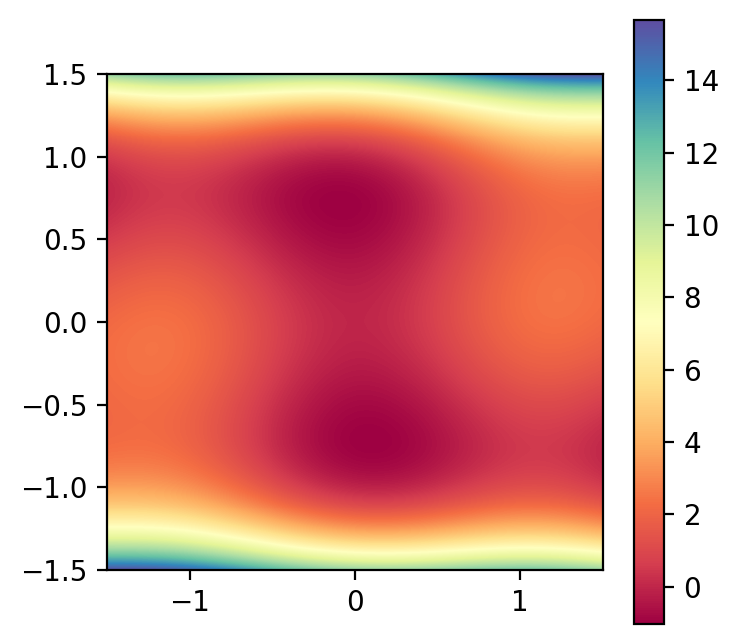

In [8]:
side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
X,Y = np.meshgrid(side,side)
combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
fvals = objective(combs)
preds = tf.transpose(tf.reshape(fvals, [num_discrete_per_dim, num_discrete_per_dim]))
plt.figure(figsize=(4, 4), dpi=200)
plt.imshow(preds, 
           interpolation='nearest', 
           extent=(objective_low, objective_high, objective_low, objective_high), 
           origin='lower', 
           cmap='Spectral')
plt.colorbar()

In [9]:
def plot_gp(model, inducing_points, inputs, title, cmap="Spectral"):

    side = np.linspace(objective_low, objective_high, num_discrete_per_dim)
    combs = PBO.acquisitions.dts.combinations(np.expand_dims(side, axis=1))
    predictions = model.predict_y(combs)
    preds = tf.transpose(tf.reshape(predictions[0], [num_discrete_per_dim, num_discrete_per_dim]))
    variances = tf.transpose(tf.reshape(predictions[1], [num_discrete_per_dim, num_discrete_per_dim]))

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle(title)
    fig.set_size_inches(18.5, 6.88)
    fig.set_dpi((200))

    ax1.axis('equal')
    im1 = ax1.imshow(preds, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax1.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax1.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax1.set_title("Mean")
    ax1.set_xlabel("x0")
    ax1.set_ylabel("x1")
    fig.colorbar(im1, ax=ax1)

    ax2.axis('equal')
    im2 = ax2.imshow(variances, 
                     interpolation='nearest', 
                     extent=(objective_low, objective_high, objective_low, objective_high), 
                     origin='lower', 
                     cmap=cmap)
    ax2.plot(inducing_points[:, 0], inducing_points[:, 1], 'kx', mew=2)
    ax2.plot(inputs[:, 0], inputs[:, 1], 'ko', mew=2, color='w')
    ax2.set_title("Variance")
    ax2.set_xlabel("x0")
    ax2.set_ylabel("x1")
    fig.colorbar(im2, ax=ax2)

    plt.savefig(fname=results_dir + title + ".png")
    plt.show()

In [10]:
def get_noisy_observation(X, objective):
    f = PBO.objectives.objective_get_f_neg(X, objective)
    return PBO.observation_model.gen_observation_from_f(X, f, 1)

In [11]:
#added inducing vars
def train_and_visualize(X, y, num_inducing, title, inducing_variables):
    lengthscale_prior = tfp.distributions.Gamma(concentration=lengthscale_prior_alpha,
                                               rate=lengthscale_prior_beta)
    
    # Train model with data
    q_mu, q_sqrt, u, inputs, k, indifference_threshold = PBO.models.learning_stochastic.train_model_fullcov(X, y, 
                                                                         num_inducing=num_inducing,
                                                                         obj_low=objective_low,
                                                                         obj_high=objective_high,
                                                                         lengthscale=lengthscale,
                                                                         lengthscale_prior=lengthscale_prior,
                                                                         num_steps=3000,
                                                                         inducing_vars=inducing_variables)
    likelihood = gpflow.likelihoods.Gaussian()
    model = PBO.models.learning.init_SVGP_fullcov(q_mu, q_sqrt, u, k, likelihood)
    u_mean = q_mu.numpy()
    inducing_vars = u.numpy()
    
    # Visualize model
    plot_gp(model, inducing_vars, inputs, title)
    
    return model, inputs, u_mean, inducing_vars

In [12]:
def uniform_grid(input_dims, num_discrete_per_dim, low=0., high=1.):
    """
    Returns an array with all possible permutations of discrete values in input_dims number of dimensions.
    :param input_dims: int
    :param num_discrete_per_dim: int
    :param low: int
    :param high: int
    :return: tensor of shape (num_discrete_per_dim ** input_dims, input_dims)
    """
    num_points = num_discrete_per_dim ** input_dims
    out = np.zeros([num_points, input_dims])
    discrete_points = np.linspace(low, high, num_discrete_per_dim)
    for i in range(num_points):
        for dim in range(input_dims):
            val = num_discrete_per_dim ** (dim)
            out[i, dim] = discrete_points[int((i // val) % num_discrete_per_dim)]
    return out

This function is our main metric for the performance of the acquisition function: The closer the model's best guess to the global minimum, the better.

In [13]:
def best_guess(model):
    """
    Returns a GP model's best guess of the global maximum of f.
    """
    xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
    res = model.predict_f(xx)[0].numpy()
    return xx[np.argmax(res)]

Store the results in these arrays:

In [14]:
num_data_at_end = int((num_init_points-1) * num_init_points / 2 + num_evals)
X_results = np.zeros([num_runs, num_data_at_end, num_choices, input_dims])
y_results = np.zeros([num_runs, num_data_at_end, 1, input_dims])
best_guess_results = np.zeros([num_runs, num_evals, input_dims])

Create the initial values for each run:

In [15]:
np.random.seed(0)
init_points = np.random.uniform(low=objective_low, high=objective_high, size=[num_runs, num_init_points, input_dims])
num_combs = int((num_init_points-1) * num_init_points / 2)
init_vals = np.zeros([num_runs, num_combs, num_choices, input_dims])
for run in range(num_runs):
    cur_idx = 0
    for init_point in range(num_init_points-1):
        for next_point in range(init_point+1, num_init_points):
            init_vals[run, cur_idx, 0] = init_points[run, init_point]
            init_vals[run, cur_idx, 1] = init_points[run, next_point]
            cur_idx += 1

The following loops carry out the Bayesian optimization algorithm over a number of runs, with a fixed number of evaluations per run.

In [16]:
np.random.seed(1)
draws = np.random.uniform(low=objective_low, 
                                         high=objective_high, 
                                         size=(num_evals, input_dims))

In [17]:
draws

array([[-0.24893399,  0.66097348],
       [-1.49965688, -0.59300228],
       [-1.05973233, -1.22298422],
       [-0.94121937, -0.46331782],
       [-0.30969758,  0.1164502 ],
       [-0.24241646,  0.5556585 ],
       [-0.88664325,  1.13435231],
       [-1.41783722,  0.51140253],
       [-0.24808559,  0.17606949],
       [-1.07883918, -0.90569553],
       [ 0.90223371,  1.40478473],
       [-0.55972747,  0.57696785],
       [ 1.12916746,  1.18381999],
       [-1.24486737, -1.38283565],
       [-0.99050874,  1.13442751],
       [-1.2049595 , -0.23667712],
       [ 1.37366859,  0.09949585],
       [ 0.57563134, -0.55345311],
       [ 0.55950278,  1.00387702],
       [-1.44513517,  0.75043294]])

Beginning run 0
Indifference_threshold is trainable.
Instructions for updating:
Use tf.identity instead.
Negative ELBO at step 0: 7.46154171172016 in 0.7948s
Negative ELBO at step 500: 2.6966408010037966 in 59.6005s
Negative ELBO at step 1000: 2.5689146401551315 in 58.3771s
Negative ELBO at step 1500: 2.3993989363768184 in 60.4630s
Negative ELBO at step 2000: 2.469897488838117 in 60.3898s
Negative ELBO at step 2500: 2.3975023553028096 in 60.3296s


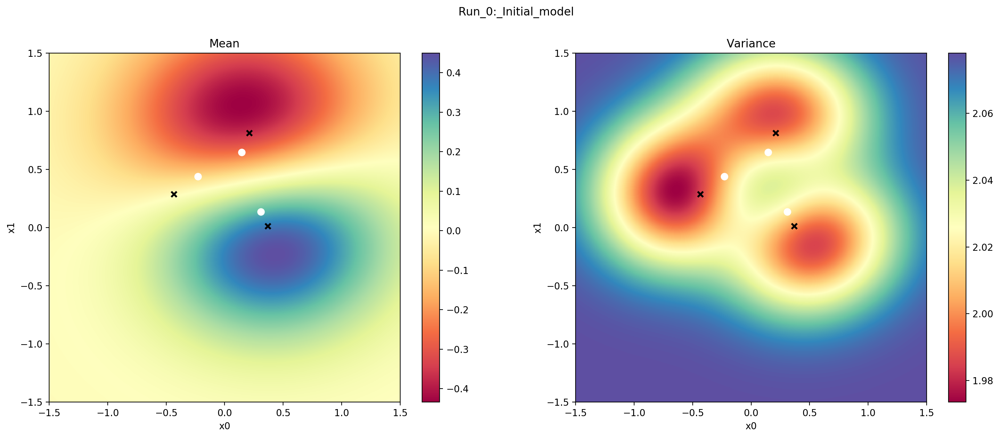

Beginning evaluation 0
Evaluation 0: Next query is [[ 0.30829013  0.13464955]
 [-0.24893399  0.66097348]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]]
Evaluation 0: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 69.82907027738021 in 0.2242s
Negative ELBO at step 500: 5.0081376587793365 in 73.8854s
Negative ELBO at step 1000: 3.9722515223986448 in 74.0735s
Negative ELBO at step 1500: 3.4049846591428032 in 74.6869s
Negative ELBO at step 2000: 3.1240466348325304 in 75.2286s
Negative ELBO at step 2500: 3.0496041775051883 in 73.0681s


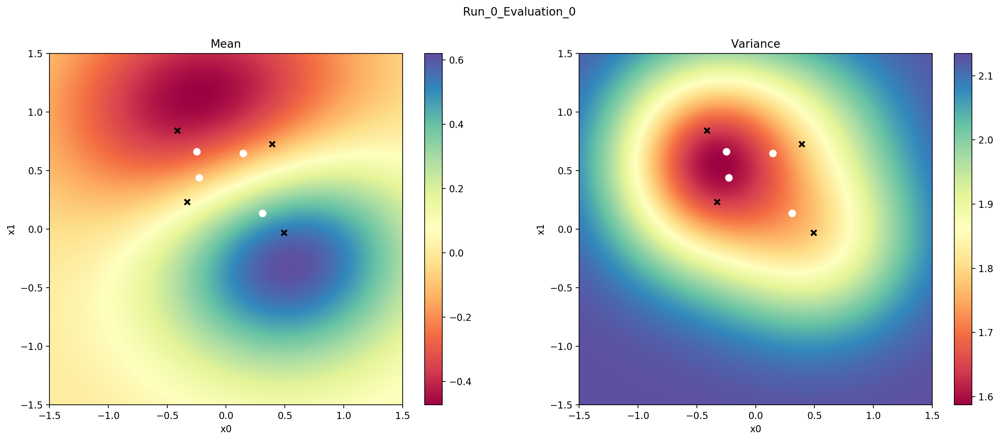

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1351205595311733
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.78741026 0.75076023]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(4, 2)",float64,"[[-0.32793322, 0.23024426..."
SVGP.q_mu,Parameter,,,False,"(4, 1)",float64,[[0.03111379...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 4, 4)",float64,"[[[0.80445449, 0., 0...."


Best guess: [ 0.54804805 -0.31681682]
Best guess val: 0.48618558006422913
Beginning evaluation 1
Evaluation 1: Next query is [[ 0.14644051  0.6455681 ]
 [-1.49965688 -0.59300228]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]]
Evaluation 1: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 81.08226333878058 in 0.2554s
Negative ELBO at step 500: 6.531761120496991 in 85.2507s
Negative ELBO at step 1000: 4.558349922846132 in 85.3619s
Negative ELBO at step 1500: 4.156795131163606 in 85.6496s
Negative ELBO at step 2000: 4.038925496228025 in 84.4008s
Negative ELBO at step 2

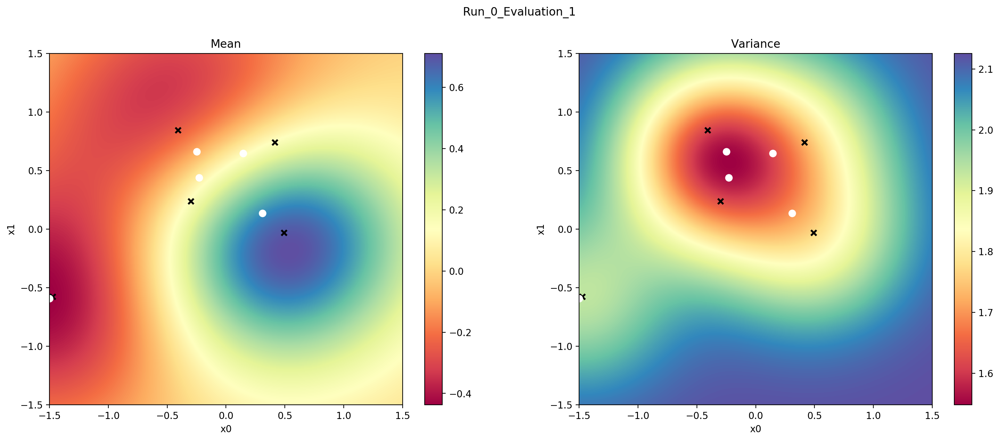

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1271821093048289
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.78704455 0.7699471 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(5, 2)",float64,"[[-0.29712876, 0.23549035..."
SVGP.q_mu,Parameter,,,False,"(5, 1)",float64,[[0.1533568...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 5, 5)",float64,"[[[0.79210755, 0., 0...."


Best guess: [ 0.54204204 -0.18768769]
Best guess val: 0.7647344233425657
Beginning evaluation 2
Evaluation 2: Next query is [[-1.49965688 -0.59300228]
 [-1.05973233 -1.22298422]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]]]
Evaluation 2: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 85.45286990947211 in 0.3516s
Negative ELBO at step 500: 7.349795375795358 in 97.4236s
Negative ELBO at step 1000: 5.327922586356623 in 96.8188s
Negative ELBO at step 1500: 4.835097565456543 in 95.

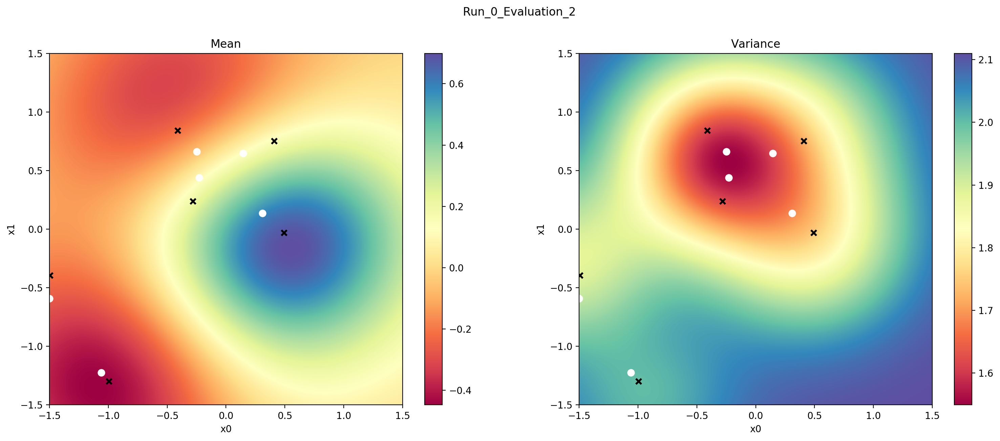

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1117825194826603
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.78932375 0.77338407]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(6, 2)",float64,"[[-0.27949848, 0.23643974..."
SVGP.q_mu,Parameter,,,False,"(6, 1)",float64,[[0.19841949...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 6, 6)",float64,"[[[0.78904857, 0., 0...."


Best guess: [ 0.55705706 -0.16066066]
Best guess val: 0.8589139554382574
Beginning evaluation 3
Evaluation 3: Next query is [[-0.2290356   0.43768234]
 [-0.94121937 -0.46331782]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]]

 [[-0.2290356   0.43768234]]]
Evaluation 3: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 87.22425686584165 in 0.3859s
Negative ELBO at step 500: 8.333609564398996 in 109.1607s
Negative ELBO at step

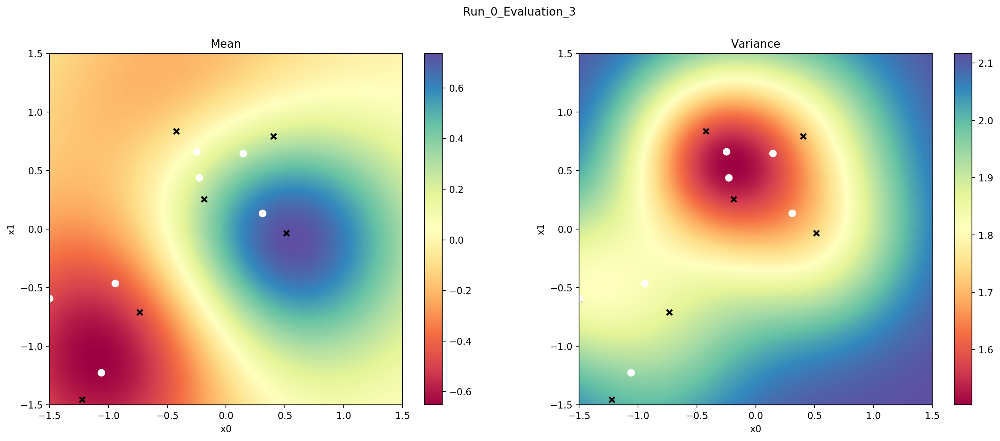

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.119263270818053
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.78883507 0.8083603 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(7, 2)",float64,"[[-0.18561502, 0.25327838..."
SVGP.q_mu,Parameter,,,False,"(7, 1)",float64,[[0.3071884...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 7, 7)",float64,"[[[0.7472317, 0., 0...."


Best guess: [ 0.57507508 -0.09159159]
Best guess val: 1.0192784001349484
Beginning evaluation 4
Evaluation 4: Next query is [[-0.24893399  0.66097348]
 [-0.30969758  0.1164502 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]]

 [[-0.2290356   0.43768234]]

 [[-0.30969758  0.1164502 ]]]
Evaluation 4: Training model
Indifference_threshold is trainable.
Negative ELBO at step 0: 556.4621010065371 in

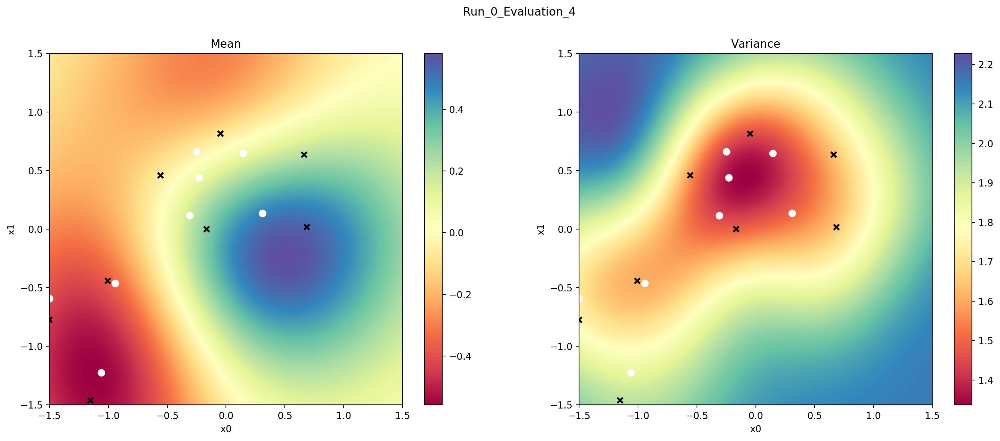

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.155960890206754
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.79466495 0.87586712]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(8, 2)",float64,"[[-5.55766587e-01, 4.57942611e-01..."
SVGP.q_mu,Parameter,,,False,"(8, 1)",float64,[[-0.06071058...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 8, 8)",float64,"[[[0.76004775, 0., 0...."


Best guess: [ 0.51201201 -0.23273273]
Best guess val: 0.5862215310250839
Beginning evaluation 5
Evaluation 5: Next query is [[ 0.14644051  0.6455681 ]
 [-0.24241646  0.5556585 ]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]]

 [[-0.2290356   0.43768234]]

 [[-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]]]
Evaluation 5: Training 

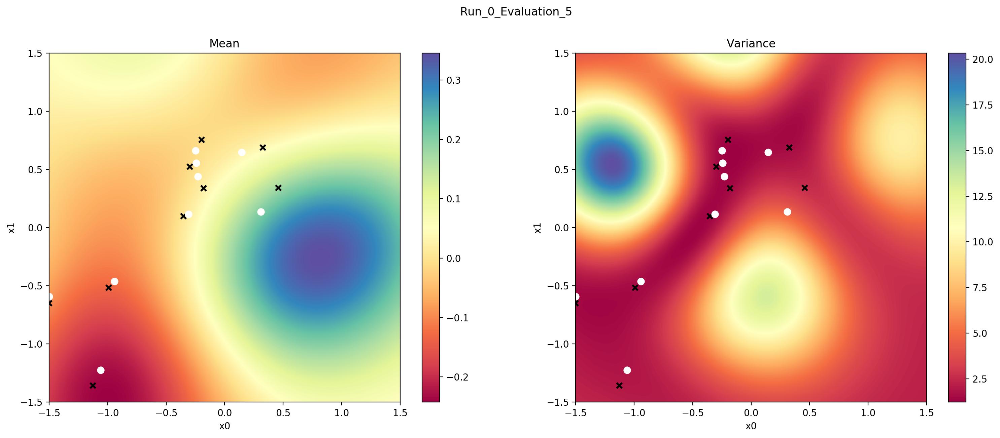

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.15842361624743
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.86529639 0.87822824]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(9, 2)",float64,"[[-0.17973256, 0.33748503..."
SVGP.q_mu,Parameter,,,False,"(9, 1)",float64,[[0.02486735...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 9, 9)",float64,"[[[7.19531473e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 0.81531532 -0.25975976]
Best guess val: 1.3654485333539874
Beginning evaluation 6
Evaluation 6: Next query is [[-1.49965688 -0.59300228]
 [-0.88664325  1.13435231]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]]

 [[-0.2290356   0.43768234]]

 [[-0.30969758  0.1164502

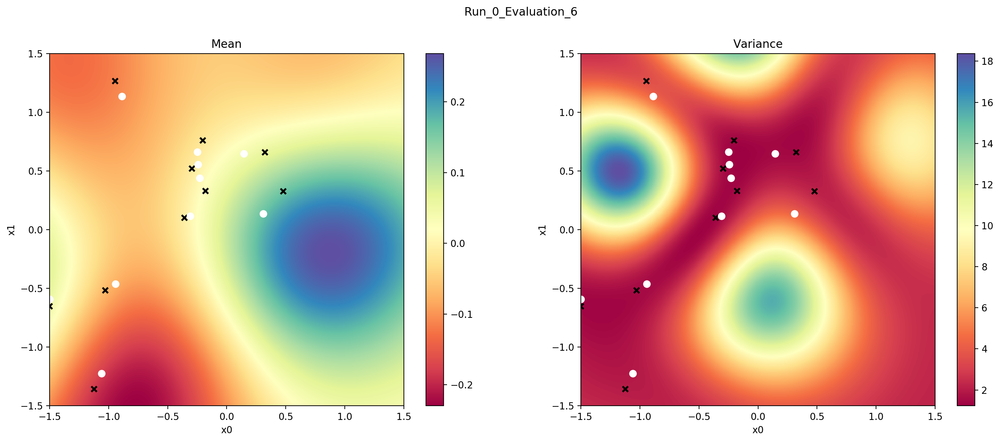

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1531553732189455
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.86443207 0.87977737]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(10, 2)",float64,"[[-0.17818853, 0.32806875..."
SVGP.q_mu,Parameter,,,False,"(10, 1)",float64,[[0.02502287...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 10, 10)",float64,"[[[7.10353654e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 0.87537538 -0.19369369]
Best guess val: 1.6680234370462528
Beginning evaluation 7
Evaluation 7: Next query is [[ 0.14644051  0.6455681 ]
 [-1.41783722  0.51140253]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]]

 [[-1.49965688 -0.59300228]

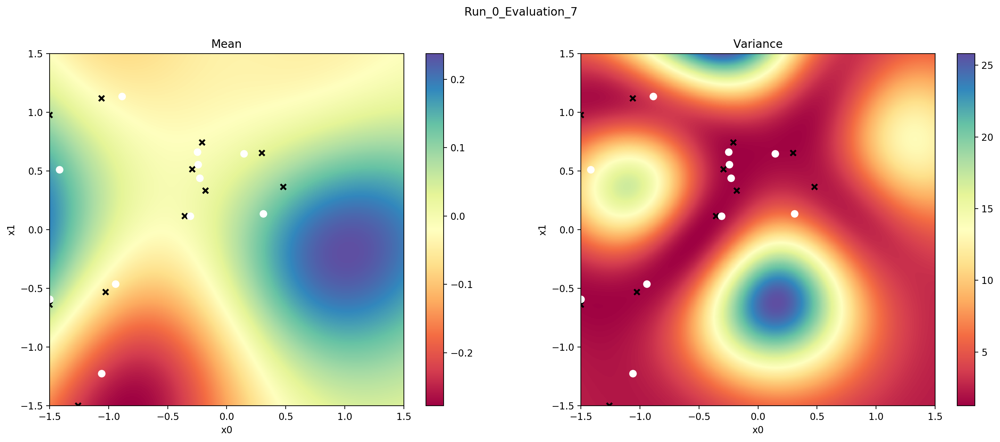

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1372867500326274
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.89797649 0.88032024]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(11, 2)",float64,"[[-0.18030341, 0.33164519..."
SVGP.q_mu,Parameter,,,False,"(11, 1)",float64,[[0.01250873...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 11, 11)",float64,"[[[7.18551292e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 1.02552553 -0.1966967 ]
Best guess val: 1.921312703205357
Beginning evaluation 8
Evaluation 8: Next query is [[-0.88664325  1.13435231]
 [-0.24808559  0.17606949]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]]

 [[ 0.30829013  0.13464955]]



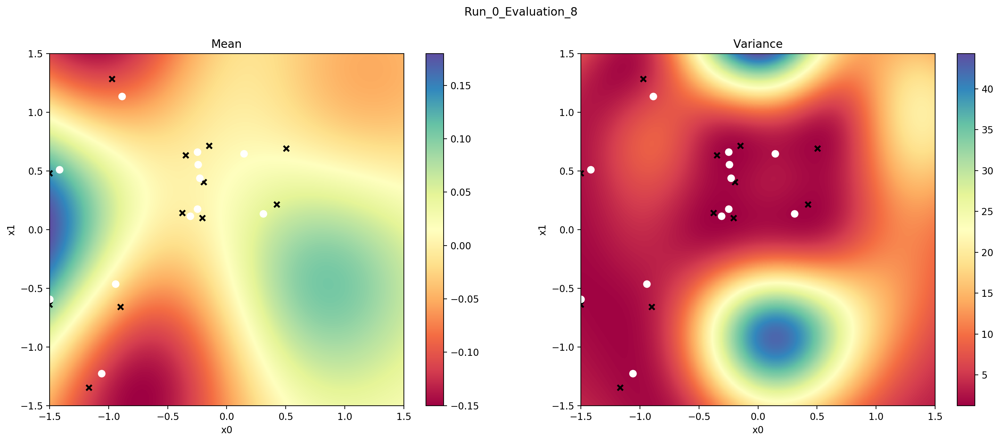

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.0968955035557928
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.83869686 0.92691289]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(12, 2)",float64,"[[-0.19461682, 0.40385043..."
SVGP.q_mu,Parameter,,,False,"(12, 1)",float64,[[0.00515831...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 12, 12)",float64,"[[[8.50108599e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-1.5         0.02852853]
Best guess val: 2.1195793490298875
Beginning evaluation 9
Evaluation 9: Next query is [[-0.24241646  0.5556585 ]
 [-1.07883918 -0.90569553]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]]
y: [[[ 0.30829013  0.13464955]]

 [[-0.2290356   0.43768234]]

 

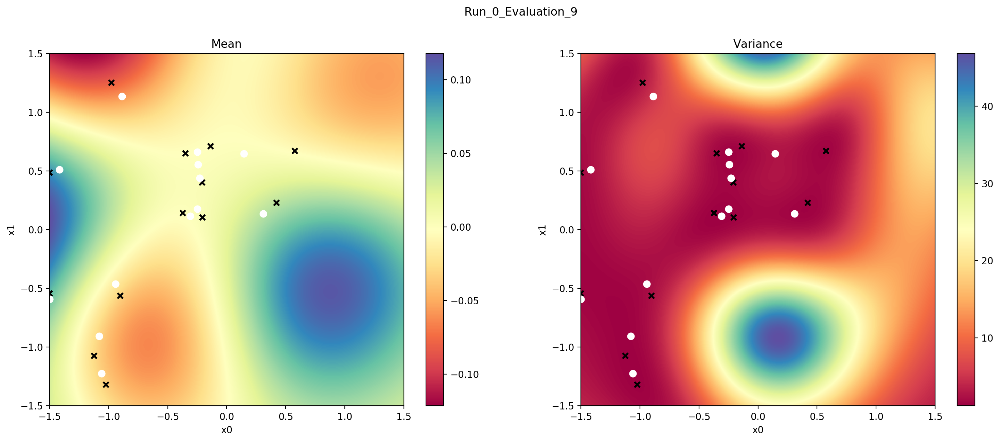

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.0938231751244172
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.86621113 0.92793579]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(13, 2)",float64,"[[-0.20880983, 0.40141873..."
SVGP.q_mu,Parameter,,,False,"(13, 1)",float64,[[0.00308894...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 13, 13)",float64,"[[[0.82977239, 0., 0...."


Best guess: [-1.5         0.09159159]
Best guess val: 1.9949630366142588
Beginning evaluation 10
Evaluation 10: Next query is [[0.14644051 0.6455681 ]
 [0.90223371 1.40478473]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]]
y: [[[ 0

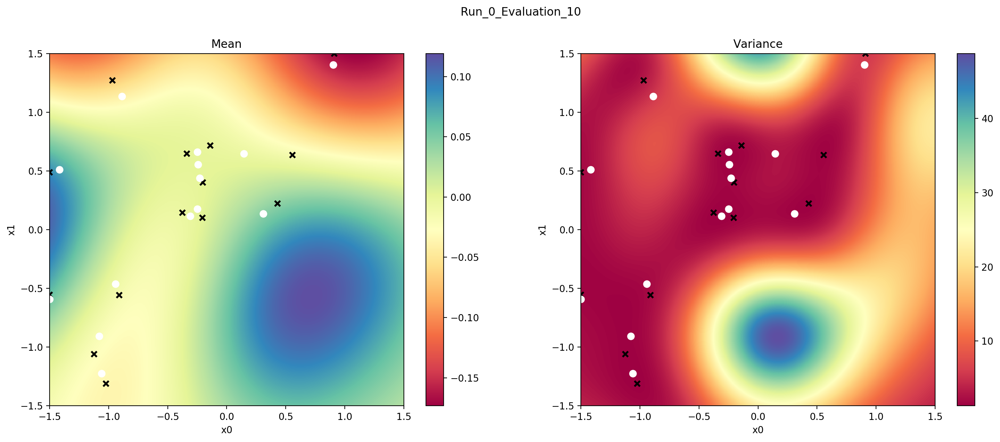

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1015412072915076
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.86317439 0.9190213 ]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(14, 2)",float64,"[[-0.2024323, 0.39999478..."
SVGP.q_mu,Parameter,,,False,"(14, 1)",float64,[[0.00137978...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 14, 14)",float64,"[[[8.30167215e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 0.71621622 -0.57507508]
Best guess val: 0.24703111115731957
Beginning evaluation 11
Evaluation 11: Next query is [[-1.05973233 -1.22298422]
 [-0.55972747  0.57696785]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[

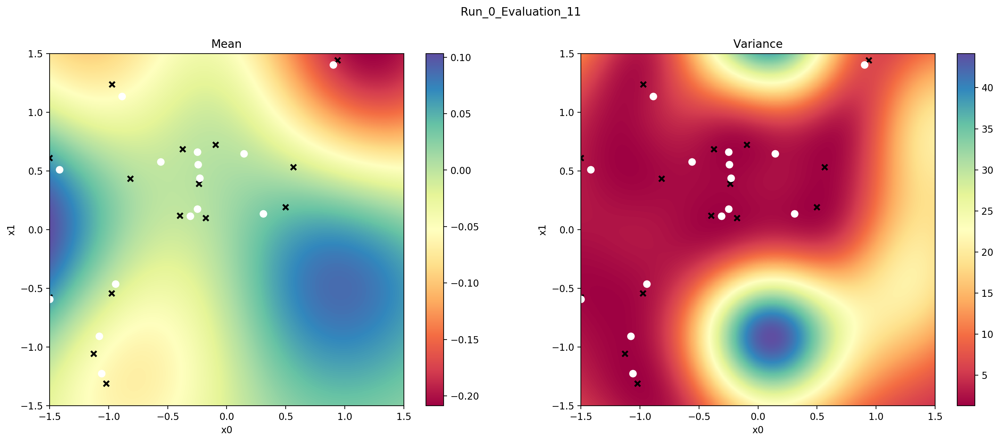

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.1003460750702305
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.860532 0.92604569]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(15, 2)",float64,"[[-0.23464236, 0.390111..."
SVGP.q_mu,Parameter,,,False,"(15, 1)",float64,[[0.00350431...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 15, 15)",float64,"[[[8.32012235e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-1.5         0.01651652]
Best guess val: 2.139759341623004
Beginning evaluation 12
Evaluation 12: Next query is [[0.14644051 0.6455681 ]
 [1.12916746 1.18381999]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[-1.059

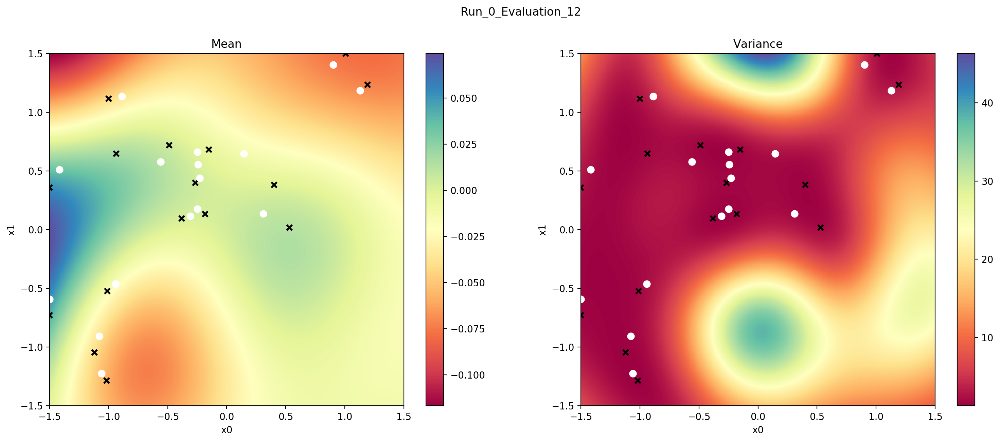

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.0959930501556965
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.862055 0.92959332]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(16, 2)",float64,"[[-0.26522713, 0.39767908..."
SVGP.q_mu,Parameter,,,False,"(16, 1)",float64,[[0.00518676...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 16, 16)",float64,"[[[8.34086810e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-1.5        -0.07357357]
Best guess val: 2.2544502827856565
Beginning evaluation 13
Evaluation 13: Next query is [[-0.24893399  0.66097348]
 [-1.24486737 -1.38283565]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[-

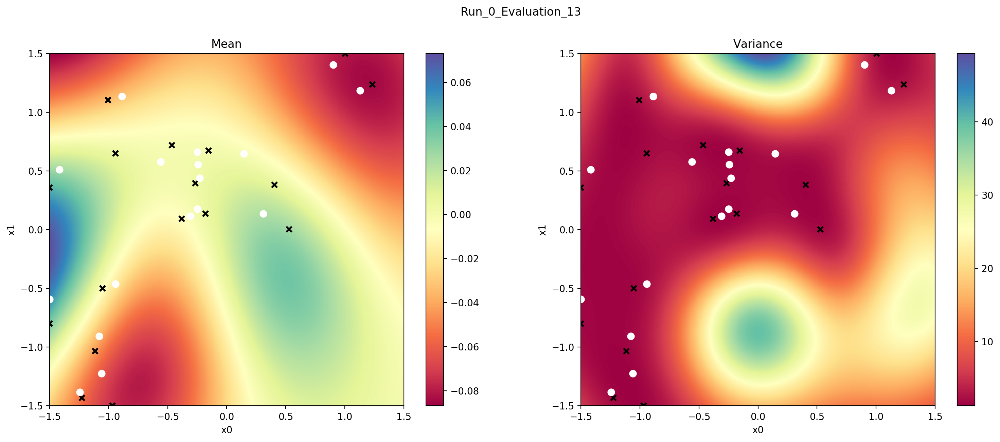

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.0981492178547516
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.85176433 0.93350746]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(17, 2)",float64,"[[-0.26560348, 0.39703688..."
SVGP.q_mu,Parameter,,,False,"(17, 1)",float64,[[2.49842905e-03...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 17, 17)",float64,"[[[8.39928449e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [-1.5        -0.17567568]
Best guess val: 2.309500579525984
Beginning evaluation 14
Evaluation 14: Next query is [[-0.55972747  0.57696785]
 [-0.99050874  1.13442751]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[-1

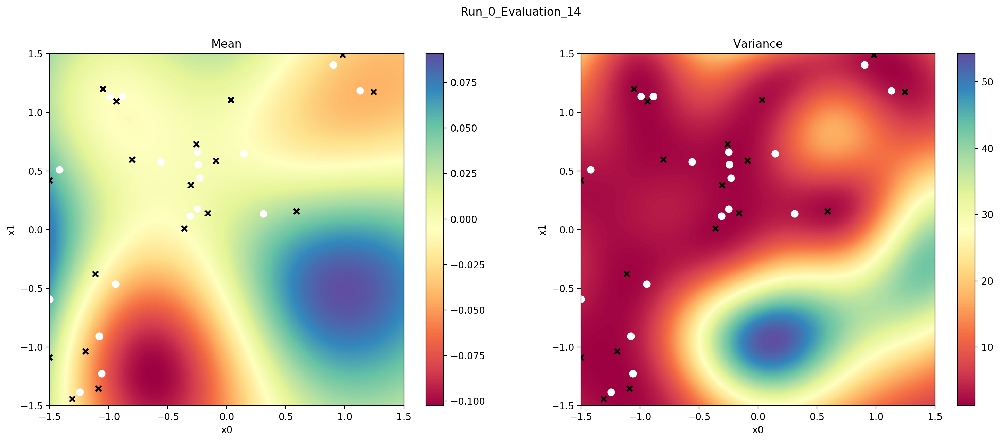

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.098078660316842
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.90173105 0.92110864]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(18, 2)",float64,"[[-0.30214775, 0.3780785..."
SVGP.q_mu,Parameter,,,False,"(18, 1)",float64,[[0.00090578...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 18, 18)",float64,"[[[8.00878427e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 1.00750751 -0.52102102]
Best guess val: 0.9291259416615706
Beginning evaluation 15
Evaluation 15: Next query is [[-0.30969758  0.1164502 ]
 [-1.2049595  -0.23667712]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[-

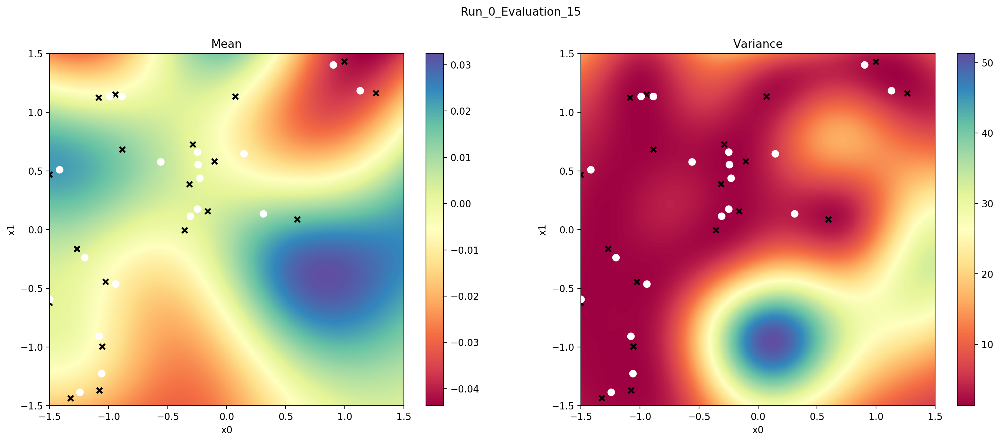

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,,True,(),float64,1.097111248946758
SVGP.kernel.lengthscale,Parameter,Softplus + Shift,Gamma,True,"(2,)",float64,[0.8949871 0.92112752]
SVGP.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,,,False,"(19, 2)",float64,"[[-0.31350118, 0.38692134..."
SVGP.q_mu,Parameter,,,False,"(19, 1)",float64,[[0.00295751...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 19, 19)",float64,"[[[8.40344282e-01, 0.00000000e+00, 0.00000000e+00..."


Best guess: [ 0.84234234 -0.3978979 ]
Best guess val: 1.0318013140606384
Beginning evaluation 16
Evaluation 16: Next query is [[-0.94121937 -0.46331782]
 [ 1.37366859  0.09949585]]
X: [[[ 0.14644051  0.6455681 ]
  [ 0.30829013  0.13464955]]

 [[ 0.14644051  0.6455681 ]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.2290356   0.43768234]]

 [[ 0.30829013  0.13464955]
  [-0.24893399  0.66097348]]

 [[ 0.14644051  0.6455681 ]
  [-1.49965688 -0.59300228]]

 [[-1.49965688 -0.59300228]
  [-1.05973233 -1.22298422]]

 [[-0.2290356   0.43768234]
  [-0.94121937 -0.46331782]]

 [[-0.24893399  0.66097348]
  [-0.30969758  0.1164502 ]]

 [[ 0.14644051  0.6455681 ]
  [-0.24241646  0.5556585 ]]

 [[-1.49965688 -0.59300228]
  [-0.88664325  1.13435231]]

 [[ 0.14644051  0.6455681 ]
  [-1.41783722  0.51140253]]

 [[-0.88664325  1.13435231]
  [-0.24808559  0.17606949]]

 [[-0.24241646  0.5556585 ]
  [-1.07883918 -0.90569553]]

 [[ 0.14644051  0.6455681 ]
  [ 0.90223371  1.40478473]]

 [[-

In [ ]:
for run in range(num_runs):
    print("Beginning run %s" % (run))
    
    X = init_vals[run]
    y = get_noisy_observation(X, objective)
    
    inducing_variables = init_points[run]
    
    model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, num_inducing_init, 
                                                               "Run_{}:_Initial_model".format(run),
                                                               inducing_variables)
    inducing_variables = inputs

    for evaluation in range(num_evals):
        print("Beginning evaluation %s" % (evaluation)) 
        
        existing_idx = np.random.randint(0, inputs.shape[0])
        existing_input = inputs[existing_idx]
#         random_input = np.random.uniform(low=objective_low, 
#                                          high=objective_high, 
#                                          size=(1, input_dims))
        
        next_query = np.zeros((num_choices, input_dims))
        next_query[0, :] = existing_input
        next_query[1, :] = draws[evaluation]
        print("Evaluation %s: Next query is %s" % (evaluation, next_query))

        X = np.concatenate([X, [next_query]])
        # Evaluate objective function
        y = np.concatenate([y, get_noisy_observation(np.expand_dims(next_query, axis=0), objective)], axis=0)
        
        print("X: {}".format(X))
        print("y: {}".format(y))
        
        inducing_variables = np.concatenate([inducing_variables, np.expand_dims(draws[evaluation], axis=0)])
        
        print("Evaluation %s: Training model" % (evaluation))
        model, inputs, u_mean, inducing_vars = train_and_visualize(X, y, 
                                                                   num_inducing_init + evaluation + 1, 
                                                                   "Run_{}_Evaluation_{}".format(run, evaluation),
                                                                   inducing_variables)
        
        
        print_summary(model)
        print("Best guess: {}".format(best_guess(model)))
        print("Best guess val: {}".format(objective(best_guess(model))))
        
        # Save model
        pickle.dump((X, y, inputs, 
                     model.kernel.variance, 
                     model.kernel.lengthscale, 
                     model.likelihood.variance, 
                     inducing_vars, 
                     model.q_mu, 
                     model.q_sqrt), 
                    open(results_dir + "Model_Run_{}_Evaluation_{}.p".format(run, evaluation), "wb"))

        best_guess_results[run, evaluation, :] = best_guess(model)

    X_results[run] = X
    y_results[run] = y

In [ ]:
get_noisy_observation(X, objective)

In [ ]:
-objective(X)

In [ ]:
np.exp(-objective(X) - np.expand_dims(tf.reduce_logsumexp(-objective(X), axis=-1), axis=1))

In [ ]:
inducing_variables

In [ ]:
pickle.dump((X_results, y_results, best_guess_results), open(results_dir + "Xybestguess.p", "wb"))

In [ ]:
def dist(x, y):
    """
    x and y have shape (..., input_dims)
    """
    return np.sqrt(np.sum((x - y) * (x - y), axis=-1))

In [ ]:
xx = uniform_grid(input_dims, num_discrete_per_dim, low=objective_low, high=objective_high)
global_min = xx[np.argmin(objective(xx))][0]

for i in range(best_guess_results.shape[0]):
    diff_from_min = dist(best_guess_results[i], global_min)
    
    x_axis = list(range(num_combs+1, num_combs+1+num_evals))
    plt.figure(figsize=(12, 6))
    plt.plot(x_axis, diff_from_min, 'kx', mew=2)
    plt.xticks(x_axis)
    plt.xlabel('Evaluations', fontsize=18)
    plt.ylabel('Best guess distance', fontsize=16)
    plt.title("Run %s" % i)
    plt.show()

In [ ]:
np.mean(PBO.objectives.six_hump_camel(best_guess_results), axis=0)